代码保存在我的[github](https://github.com/5697526/VGG_BatchNorm.git)

模型和可视化结果保存在我的网盘: https://pan.baidu.com/s/1-OalQPQvMTUNwAJnRb5-dQ?pwd=8nxp 提取码: 8nxp

## 一、实验目的

Batch Normalization（BN）作为一种广泛应用的技术，能够加速训练过程并提高训练的稳定性，改善模型的收敛速度和泛化能力。本实验旨在对比 VGG - A 模型在使用和不使用 BN 时的性能和特征，并探究 BN 如何帮助优化过程，具体通过测量损失景观、梯度预测性和梯度最大差异来进行分析。

## 二、数据集介绍

### 2.1 数据集来源  


本次实验使用的 CIFAR - 10 数据集是一个广泛用于图像分类研究的公开数据集，该数据集可从 [CIFAR - 10 ](https://www.cs.toronto.edu/~kriz/cifar.html)下载。

### 2.2 数据集内容

CIFAR - 10 数据集总共包含 60,000 张 32×32 像素的彩色图像，涵盖有10个不同的类别：飞机（Airplane），汽车（Automobile），鸟（Bird），猫（Cat），鹿（Deer），狗（Dog），青蛙（Frog），马（Horse），船（Ship）和卡车（Truck）。数据集被划分为训练集和测试集两部分，其中训练集包含 50,000 张图像，每个类别有 5,000 张，测试集包含 10,000 张图像，每个类别有 1,000 张。图像采用 RGB 三通道模式，每个通道是一个 32×32 的矩阵，矩阵中的每个元素表示该通道在对应像素位置的颜色强度，取值范围为 0 - 255。

### 2.3 数据格式与存储

CIFAR - 10 数据集以二进制文件的形式存储，分为多个批次。训练集被分成 5 个数据批次（data_batch_1 - data_batch_5），每个批次包含 10,000 张图像。测试集则存储在一个单独的文件（test_batch）中。每个数据批次文件包含图像数据和对应的标签，图像数据以一维数组的形式存储。

## 五、模型构建

在 models\vgg.py 中定义了 VGG-A 模型和添加了 Batch Normalization 层的VGG - A with BN 模型。

### 5.1 VGG - A 模型

由 VGG_A 类实现，包含多个卷积层、ReLU 激活函数和最大池化层，最后通过全连接层进行分类。其中，输入图像尺寸为 32x32x3。

#### (1) 类定义和初始化

VGG_A 类继承自 nn.Module，这是 PyTorch 中所有神经网络模块的基类。

In [ ]:
class VGG_A(nn.Module):
    def __init__(self, inp_ch=3, num_classes=10, init_weights=True):
        super().__init__()

#### (2) 特征提取层 

self.features 是一个 nn.Sequential 对象，它按顺序包含了多个卷积层、ReLU 激活函数和最大池化层，用于从输入图像中提取特征。整个特征提取部分被分为 5 个阶段（stage）,操作如下：

卷积层 (nn.Conv2d)：使用 3x3 的卷积核进行卷积操作，padding=1 确保卷积前后图像的空间尺寸不变。每个阶段的卷积层会逐渐增加输出通道数，从 64 增加到 512。

ReLU 激活函数 (nn.ReLU)：引入非线性，增加模型的表达能力。

最大池化层 (nn.MaxPool2d)：使用 2x2 的池化核，步长为 2，对特征图进行下采样，减少特征图的空间尺寸。

In [ ]:
self.features = nn.Sequential(
    # stage 1
    nn.Conv2d(in_channels=inp_ch, out_channels=64,
              kernel_size=3, padding=1),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2),

    # stage 2
    nn.Conv2d(in_channels=64, out_channels=128,
              kernel_size=3, padding=1),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2),

    # stage 3
    nn.Conv2d(in_channels=128, out_channels=256,
              kernel_size=3, padding=1),
    nn.ReLU(True),
    nn.Conv2d(in_channels=256, out_channels=256,
              kernel_size=3, padding=1),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2),

    # stage 4
    nn.Conv2d(in_channels=256, out_channels=512,
              kernel_size=3, padding=1),
    nn.ReLU(True),
    nn.Conv2d(in_channels=512, out_channels=512,
              kernel_size=3, padding=1),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2),

    # stage5
    nn.Conv2d(in_channels=512, out_channels=512,
              kernel_size=3, padding=1),
    nn.ReLU(True),
    nn.Conv2d(in_channels=512, out_channels=512,
              kernel_size=3, padding=1),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2))

#### (3) 分类器层

self.classifier 也是一个 nn.Sequential 对象，包含了三个全连接层和两个 ReLU 激活函数，用于将特征提取层输出的特征映射到分类结果。

In [ ]:
self.classifier = nn.Sequential(
    nn.Linear(512 * 1 * 1, 512),
    nn.ReLU(),
    nn.Linear(512, 512),
    nn.ReLU(),
    nn.Linear(512, num_classes))

#### (4) 权重初始化

如果 init_weights 为 True，则调用 _init_weights 方法对模型的权重进行初始化。

In [ ]:
if init_weights:
    self._init_weights()


def _init_weights(self):
    for m in self.modules():
        init_weights_(m)

#### (5) 前向传播方法

forward 方法定义了模型的前向传播过程。

In [ ]:
def forward(self, x):
    x = self.features(x)
    x = self.classifier(x.view(-1, 512 * 1 * 1))
    return x

### 5.2 VGG - A with BN 模型

VGG_A_BatchNorm 类是基于 PyTorch 实现的神经网络模型，继承自 nn.Module，属于 VGG 网络架构的一种变体，它在 VGG_A 模型的基础上添加了批量归一化（Batch Normalization）层。

#### (1) 类定义与初始化

VGG_A_BatchNorm 继承自 nn.Module，是 PyTorch 中所有神经网络模块的基类。

In [ ]:
class VGG_A_BatchNorm(nn.Module):
    def __init__(self, inp_ch=3, num_classes=10, init_weights=True):
        super().__init__()

#### (2) 特征提取层

self.features 是一个 nn.Sequential 对象，按顺序包含多个卷积层、批量归一化层、ReLU 激活函数和最大池化层，用于从输入图像中提取特征。整个特征提取部分分为 5 个阶段（stage），除了有与 VGG_A 类相同的卷积层、ReLU 激活函数和最大池化层以外，还有额外的批量归一化层 (nn.BatchNorm2d)，在每个卷积层之后添加，用于对卷积层的输出进行归一化处理，加速模型收敛并提高稳定性。

In [ ]:
self.features = nn.Sequential(
    # stage 1
    nn.Conv2d(in_channels=inp_ch, out_channels=64,
              kernel_size=3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2),

    # stage 2
    nn.Conv2d(in_channels=64, out_channels=128,
              kernel_size=3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2),

    # stage 3
    nn.Conv2d(in_channels=128, out_channels=256,
              kernel_size=3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    nn.Conv2d(in_channels=256, out_channels=256,
              kernel_size=3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2),

    # stage 4
    nn.Conv2d(in_channels=256, out_channels=512,
              kernel_size=3, padding=1),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    nn.Conv2d(in_channels=512, out_channels=512,
              kernel_size=3, padding=1),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2),

    # stage5
    nn.Conv2d(in_channels=512, out_channels=512,
              kernel_size=3, padding=1),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    nn.Conv2d(in_channels=512, out_channels=512,
              kernel_size=3, padding=1),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    nn.MaxPool2d(kernel_size=2, stride=2))

#### (3) 分类器层

self.classifier 也是一个 nn.Sequential 对象，包含三个全连接层、两个批量归一化层和两个 ReLU 激活函数，用于将特征提取层输出的特征映射到分类结果。

In [ ]:
self.classifier = nn.Sequential(
    nn.Linear(512 * 1 * 1, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Linear(512, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Linear(512, num_classes))

#### (4) 权重初始化

如果 init_weights 为 True，则调用 _init_weights 方法对模型的权重进行初始化。

In [ ]:
if init_weights:
    self._init_weights()


def _init_weights(self):
    for m in self.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(
                m.weight, mode='fan_out', nonlinearity='relu')
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.BatchNorm2d):
            nn.init.constant_(m.weight, 1)
            nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.Linear):
            nn.init.normal_(m.weight, 0, 0.01)
            nn.init.constant_(m.bias, 0)

#### (5) 前向传播方法

forward 方法定义了模型的前向传播过程。

In [ ]:
def forward(self, x):
    x = self.features(x)
    x = self.classifier(x.view(-1, 512 * 1 * 1))
    return x

## 四、实验过程

### 4.1 依赖安装

确保已经安装了 Python 环境，并且安装必要的 Python 库。

### 4.2 数据加载

用`data\loaders.py`下载 CIFAR - 10 数据集，并加载数据。

### 4.3 模型训练及可视化评估

运行 `VGG_Loss_Landscape.py` 脚本进行模型训练和评估。

#### (1) get_accuracy 函数:

用于计算模型在数据集上的准确率。

In [ ]:
def get_accuracy(model, loader):
    correct = 0
    total = 0
    model.eval()
    with torch.no_grad():
        for data in loader:
            x, y = data
            x = x.to(device)
            y = y.to(device)
            outputs = model(x)
            _, predicted = torch.max(outputs.data, 1)
            total += y.size(0)
            correct += (predicted == y).sum().item()
    return correct / total

#### (2) train 函数：

完成整个训练过程，记录每个步骤的损失值和梯度，并在每个 epoch 结束时计算训练集和验证集的准确率。同时，会保存最佳模型。

In [ ]:
def train(model, optimizer, criterion, train_loader, val_loader, scheduler=None, epochs_n=100, best_model_path=None, lr=None):
    model.to(device)
    learning_curve = [np.nan] * epochs_n
    train_accuracy_curve = [np.nan] * epochs_n
    val_accuracy_curve = [np.nan] * epochs_n
    max_val_accuracy = 0
    max_val_accuracy_epoch = 0

    batches_n = len(train_loader)
    losses_list = []
    grads = []
    for epoch in tqdm(range(epochs_n), unit='epoch'):
        if scheduler is not None:
            scheduler.step()
        model.train()

        loss_list = []  # use this to record the loss value of each step
        grad = []  # use this to record the loss gradient of each step
        learning_curve[epoch] = 0  # maintain this to plot the training curve

        for data in train_loader:
            x, y = data
            x = x.to(device)
            y = y.to(device)
            optimizer.zero_grad()
            prediction = model(x)
            loss = criterion(prediction, y)

            loss_list.append(loss.item())
            learning_curve[epoch] += loss.item()

            # Calculate gradient
            loss.backward()

            # Record gradient (fix: calculate gradient magnitude correctly)
            current_grad_value = None
            if hasattr(model, 'classifier') and len(model.classifier) > 4:
                weight_grad = model.classifier[4].weight.grad
                if weight_grad is not None:
                    # Calculate mean absolute value of the gradient
                    current_grad_value = np.mean(
                        np.abs(weight_grad.clone().cpu().numpy()))

            # Append the current gradient value to the list
            if current_grad_value is not None:
                grad.append(current_grad_value)

            optimizer.step()
            optimizer.zero_grad()  # Clear gradients for next iteration

        losses_list.append(loss_list)
        grads.append(grad)

        # Calculate accuracies
        train_acc = get_accuracy(model, train_loader)
        val_acc = get_accuracy(model, val_loader)
        train_accuracy_curve[epoch] = train_acc
        val_accuracy_curve[epoch] = val_acc

        # Save best model (with complete information)
        if val_acc > max_val_accuracy:
            max_val_accuracy = val_acc
            max_val_accuracy_epoch = epoch
            if best_model_path is not None:
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'accuracy': val_acc,
                }, best_model_path)

        print(f'Epoch {epoch+1}/{epochs_n}')
        print(f'Train Accuracy: {train_acc:.4f}, Val Accuracy: {val_acc:.4f}')
        print(
            f'Best Val Accuracy: {max_val_accuracy:.4f} at epoch {max_val_accuracy_epoch+1}')

    # Save losses and gradients
    np.save(os.path.join(losses_path, f'losses_lr_{lr}.npy'), losses_list)
    np.save(os.path.join(grads_path, f'grads_lr_{lr}.npy'), grads)

    return losses_list, grads, train_accuracy_curve, val_accuracy_curve

#### (3) plot_loss_landscape 函数：

绘制损失景观图，对比使用 BN 和不使用 BN 的模型在训练过程中的损失变化范围。


In [ ]:
def plot_loss_landscape(losses_without_bn, losses_with_bn, title, save_path,
                        percentile_range=(5, 95), plot_mean=True):
    # Compute aligned statistics
    x, min_without_bn, max_without_bn, mean_without_bn = align_and_compute_statistics(
        losses_without_bn, percentile_range=percentile_range)
    x, min_with_bn, max_with_bn, mean_with_bn = align_and_compute_statistics(
        losses_with_bn, percentile_range=percentile_range)

    plt.figure(figsize=(12, 7))

    # Plot losses without BN
    plt.fill_between(x, min_without_bn, max_without_bn, color='blue', alpha=0.2,
                     label=f'Loss Range without BN ({percentile_range[0]}-{percentile_range[1]}%)')
    if plot_mean:
        plt.plot(x, mean_without_bn, color='blue', linestyle='-',
                 label='Mean Loss without BN', alpha=0.7)

    # Plot losses with BN
    plt.fill_between(x, min_with_bn, max_with_bn, color='red', alpha=0.2,
                     label=f'Loss Range with BN ({percentile_range[0]}-{percentile_range[1]}%)')
    if plot_mean:
        plt.plot(x, mean_with_bn, color='red', linestyle='-',
                 label='Mean Loss with BN', alpha=0.7)

    plt.xlabel('Training Steps')
    plt.ylabel('Loss Value')
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Remove scientific notation and use linear scale
    plt.ticklabel_format(axis='y', style='plain', scilimits=(0, 0))

    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.close()

#### (4) plot_gradient_landscape 函数

绘制梯度景观图，对比使用 BN 和不使用 BN 的模型在训练过程中的梯度变化范围。

In [ ]:
def plot_gradient_landscape(grads_without_bn, grads_with_bn, title, save_path,
                            percentile_range=(5, 95), plot_mean=True):
    """
    Plot gradient landscape with linear y-axis scale
    """
    # Compute aligned statistics
    x, min_without_bn, max_without_bn, mean_without_bn = align_and_compute_statistics(
        grads_without_bn, percentile_range=percentile_range)
    x, min_with_bn, max_with_bn, mean_with_bn = align_and_compute_statistics(
        grads_with_bn, percentile_range=percentile_range)

    plt.figure(figsize=(12, 7))

    # Plot gradients without BN
    plt.fill_between(x, min_without_bn, max_without_bn, color='blue', alpha=0.2,
                     label=f'Gradient Range without BN ({percentile_range[0]}-{percentile_range[1]}%)')
    if plot_mean:
        plt.plot(x, mean_without_bn, color='blue', linestyle='-',
                 label='Mean Gradient without BN', alpha=0.7)

    # Plot gradients with BN
    plt.fill_between(x, min_with_bn, max_with_bn, color='red', alpha=0.2,
                     label=f'Gradient Range with BN ({percentile_range[0]}-{percentile_range[1]}%)')
    if plot_mean:
        plt.plot(x, mean_with_bn, color='red', linestyle='-',
                 label='Mean Gradient with BN', alpha=0.7)

    plt.xlabel('Training Steps')
    plt.ylabel('Gradient Value')
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Remove scientific notation and use linear scale
    plt.ticklabel_format(axis='y', style='plain', scilimits=(0, 0))

    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.close()

#### (5) plot_accuracy_comparison 函数

准确率对比可视化函数，用于展示不同学习率、是否含 BN 的模型在训练集和验证集上的准确率变化。

In [ ]:
def plot_accuracy_comparison(accuracies, title, save_path):
    """
    Plot accuracy comparison between different models and learning rates

    Args:
    accuracies: Dictionary containing accuracy curves for different models and learning rates
    title: Plot title
    save_path: Path to save the plot
    """
    plt.figure(figsize=(12, 7))

    colors = ['blue', 'red', 'green', 'purple']

    for i, (lr, lr_data) in enumerate(accuracies.items()):
        # Plot training accuracy
        plt.plot(lr_data['train_without_bn'], color=colors[i], linestyle='-',
                 label=f'Train w/o BN, lr={lr}')
        plt.plot(lr_data['train_with_bn'], color=colors[i], linestyle='--',
                 label=f'Train with BN, lr={lr}')

        # Plot validation accuracy
        plt.plot(lr_data['val_without_bn'], color=colors[i], linestyle=':',
                 label=f'Val w/o BN, lr={lr}')
        plt.plot(lr_data['val_with_bn'], color=colors[i], linestyle='-.',
                 label=f'Val with BN, lr={lr}')

    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.ylim(0, 1)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.close()

#### (6) 主函数__main__

在 `__main__` 函数中，设置了多个学习率 [1e-3, 2e-3, 1e-4, 5e-4]，分别对使用 BN 和不使用 BN 的模型进行训练。

In [ ]:
if __name__ == '__main__':
    # Windows system multiprocessing support
    if os.name == 'nt':
        import torch.multiprocessing as mp
        mp.freeze_support()

    # Create output directories with timestamp
    os.makedirs(figures_path, exist_ok=True)
    os.makedirs(models_path, exist_ok=True)

    # Initialize data loaders
    try:
        train_loader = get_cifar_loader(train=True, num_workers=num_workers)
        val_loader = get_cifar_loader(train=False, num_workers=num_workers)

        # Verify data loader
        X, y = next(iter(train_loader))
        print(f"Data shape: {X.shape}, Labels shape: {y.shape}")
    except Exception as e:
        print(f"Data loading failed: {e}")
        exit(1)

    # Training parameters
    epo = 20
    learning_rates = [1e-3, 2e-3, 1e-4, 5e-4]

    all_losses_without_bn = []
    all_grads_without_bn = []
    all_losses_with_bn = []
    all_grads_with_bn = []

    for lr in learning_rates:
        set_random_seeds(seed_value=2020, device=str(device))

        # Train model without BN
        model_without_bn = VGG_A()
        optimizer_without_bn = torch.optim.Adam(
            model_without_bn.parameters(), lr=lr)
        criterion = nn.CrossEntropyLoss()
        best_model_path_without_bn = os.path.join(
            models_path, f'best_model_without_bn_{lr}_{timestamp}.pth')
        losses_without_bn, grads_without_bn = train(
            model_without_bn, optimizer_without_bn, criterion, train_loader, val_loader, epochs_n=epo, best_model_path=best_model_path_without_bn, lr=lr
        )
        all_losses_without_bn.extend(losses_without_bn)
        all_grads_without_bn.extend(grads_without_bn)

        # Train model with BN
        model_with_bn = VGG_A_BatchNorm()
        optimizer_with_bn = torch.optim.Adam(model_with_bn.parameters(), lr=lr)
        best_model_path_with_bn = os.path.join(
            models_path, f'best_model_with_bn_{lr}_{timestamp}.pth')
        losses_with_bn, grads_with_bn = train(
            model_with_bn, optimizer_with_bn, criterion, train_loader, val_loader, epochs_n=epo, best_model_path=best_model_path_with_bn, lr=lr
        )
        all_losses_with_bn.extend(losses_with_bn)
        all_grads_with_bn.extend(grads_with_bn)

    # Plot loss landscape
        plot_loss_landscape(all_losses_without_bn, all_losses_with_bn, 'Loss Landscape Comparison (w/o BN vs w/ BN)',
                            os.path.join(figures_path, f'loss_landscape_comparison_{lr}_{timestamp}.png'))

    # Plot gradient landscape
        plot_gradient_landscape(all_grads_without_bn, all_grads_with_bn, 'Gradient Landscape Comparison (w/o BN vs w/ BN)',
                                os.path.join(figures_path, f'gradient_landscape_comparison_{lr}_{timestamp}.png'))

## 五、实验结果

### 5.1 训练过程可视化

通过 plot_accuracy_comparison 函数绘制的准确率曲线，可以直观地观察到模型在训练过程中的性能变化。在不同学习率下，对比使用 BN 和不使用 BN 的模型，发现使用 BN 的模型通常具有更快的收敛速度和更高的验证准确率。


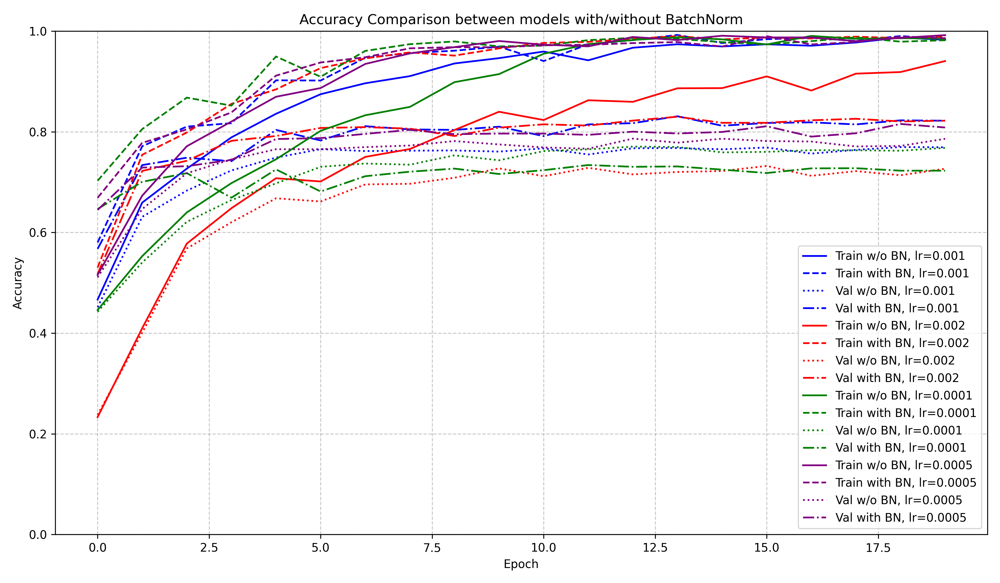
*图1：不同学习率的训练进度*

BN 通过减少内部协变量偏移、缓解梯度消失和梯度爆炸问题、提高模型的泛化能力以及使训练过程更加稳定等方式，使得模型在不同学习率下通常具有更快的收敛速度和更高的验证准确率。

经过对不同学习率下的训练损失和准确率曲线的初步观察，使用 BN 的模型在20个 epoch 的训练后，学习率取0.0005、0.001、0.002时均可达到较为平稳的 80% 以上的准确率。

### 5.2 损失景观图

通过 plot_loss_landscape 函数绘制的损失景观图，对比使用 BN 和不使用 BN 的模型在训练过程中的损失变化范围。


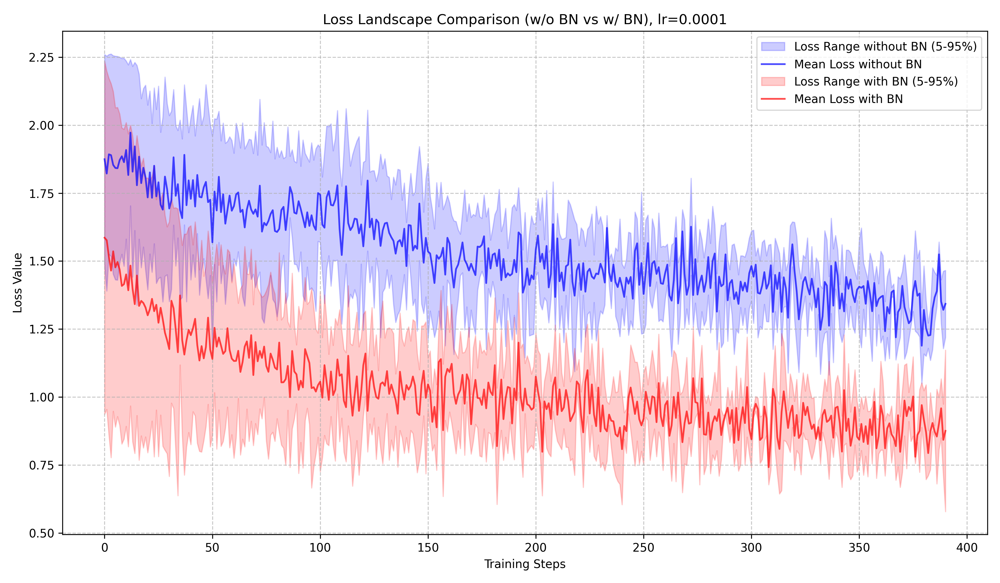
*图2：学习率=0.0001的损失景观图*

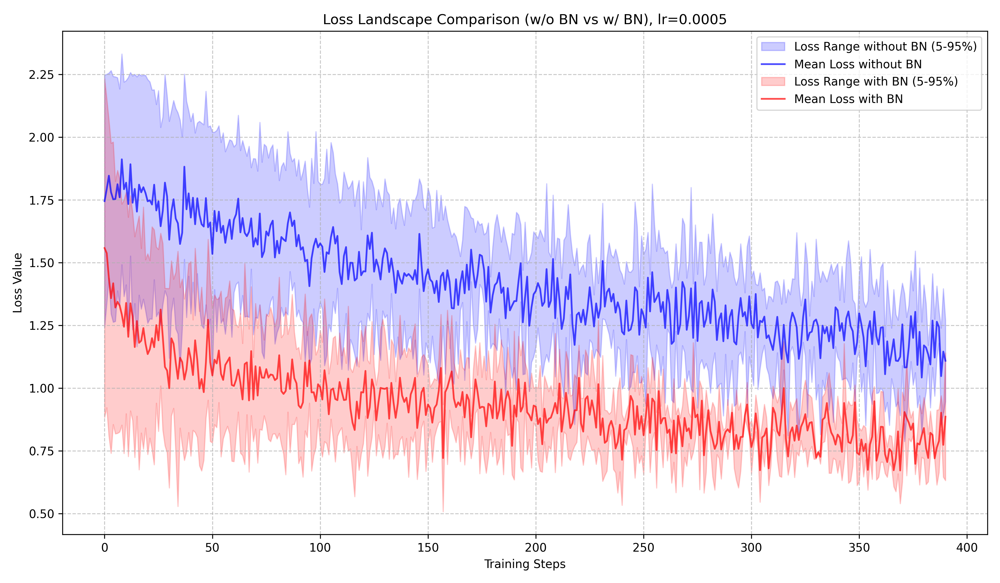
*图3：学习率=0.0005的损失景观图*

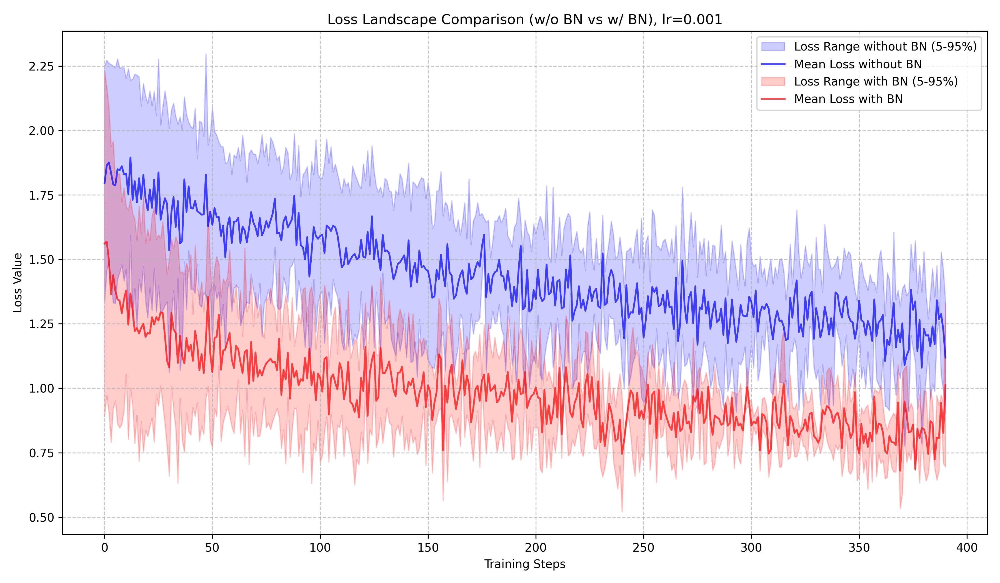
*图4：学习率=0.001的损失景观图*

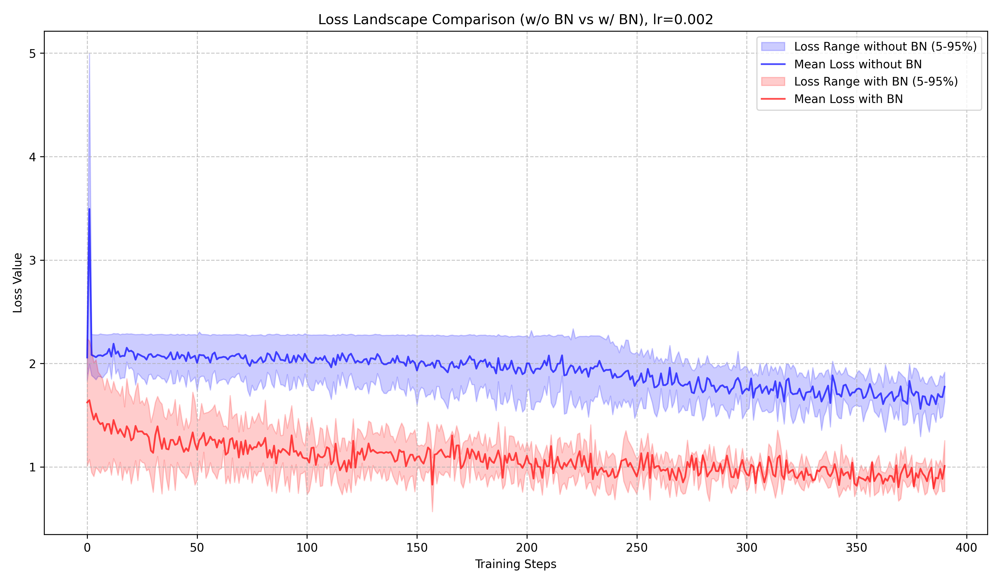
*图5：学习率=0.002的损失景观图*

在训练过程中，由于 BN 减少了内部协变量偏移，使得模型的梯度更加稳定。梯度的稳定性意味着在每次参数更新时，参数的变化不会过于剧烈，从而使得损失函数的变化也更加平稳。从实验结果来看，使用 BN 的模型损失波动较小，说明 BN 有效地缓解了内部协变量偏移带来的问题，使得训练过程更加稳定。

### 5.3 梯度景观图

通过 plot_gradient_landscape 函数绘制的梯度景观图，对比使用 BN 和不使用 BN 的模型在训练过程中的梯度变化范围。

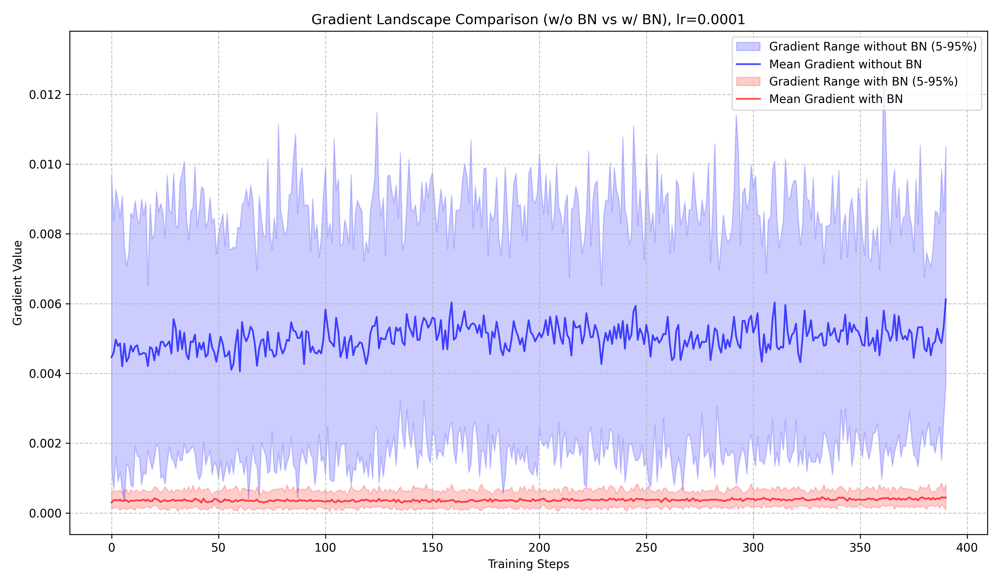
*图6：学习率=0.0001的梯度景观图*

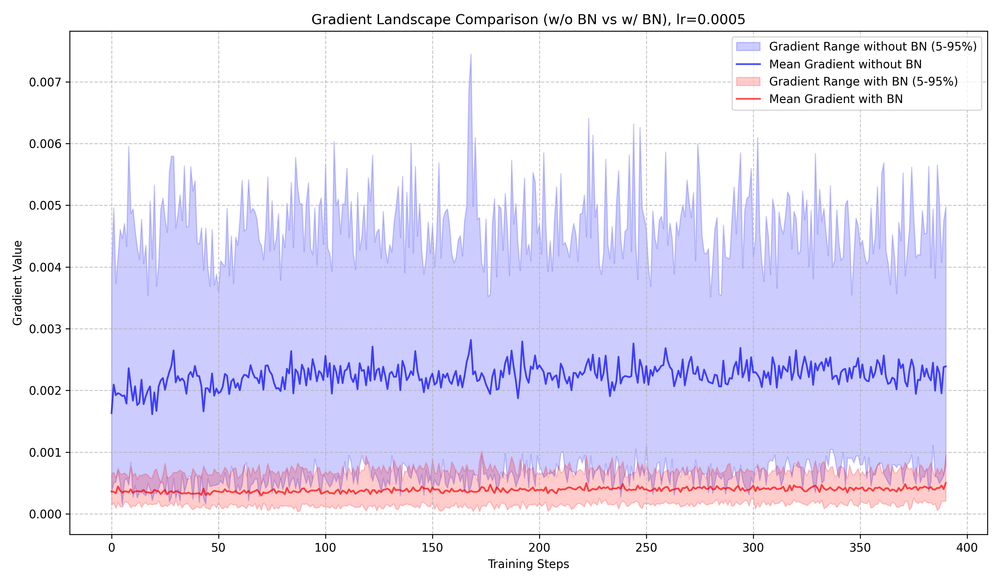
*图7：学习率=0.0005的梯度景观图*

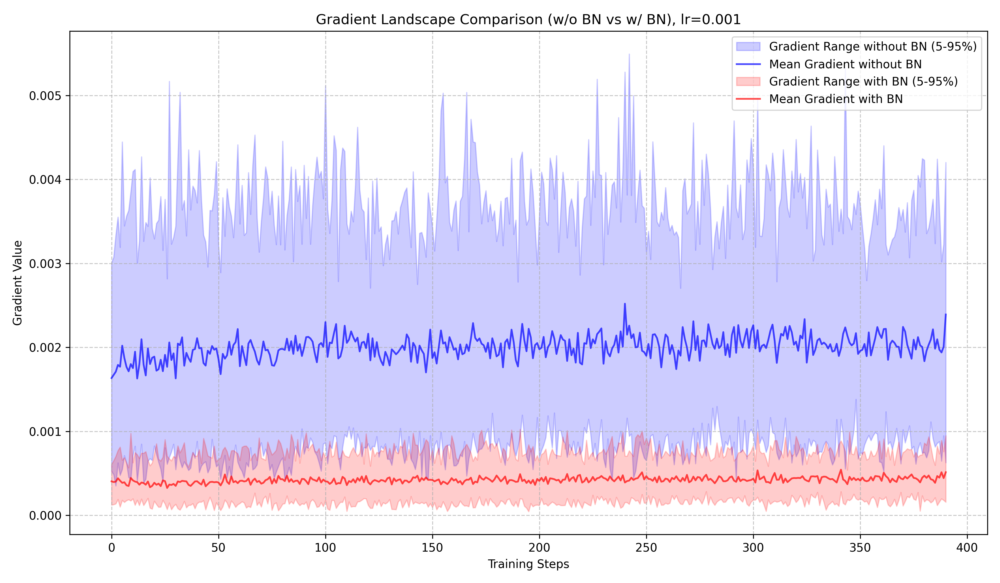
*图8：学习率=0.001的梯度景观图*

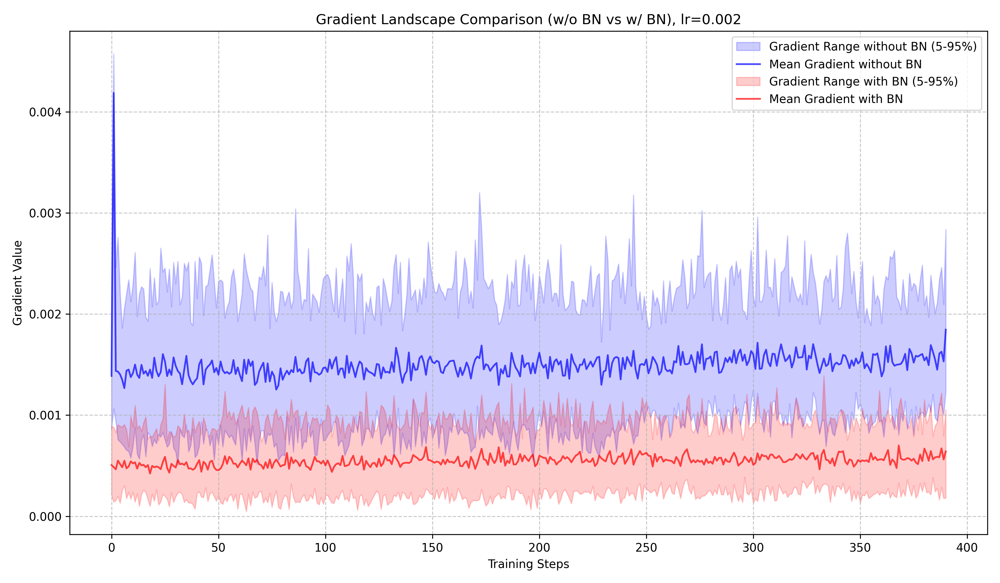
*图9：学习率=0.002的梯度景观图*

结果显示，使用 BN 的模型梯度波动较小，说明 BN 通过减少内部协变量偏移、稳定梯度传播等方式平滑了梯度，避免了梯度消失或爆炸的问题，从而加速了深度神经网络的训练过程。

### 5.4 学习率选择

较大的学习率能使模型在训练初期快速地朝着最优解的方向前进，从而加快收敛速度。对于使用 BN 的模型来说，由于 BN 能缓解梯度消失和梯度爆炸问题，使得梯度更加稳定，因此可以承受相对较大的学习率。然而，较大的学习率也可能导致模型在训练过程中跳过最优解，使得损失值在最优解附近波动较大，难以收敛到一个稳定的最优解。而较小的学习率会使模型在每次参数更新时的调整幅度较小，这有助于模型更细致地探索损失函数的地形，从而有可能收敛到更接近全局最优解的位置，提高模型的泛化能力和验证准确率。但较小的学习率也会导致模型收敛速度变慢，训练时间变长。在实际应用中，如果学习率过小，模型可能会陷入局部最优解，或者在训练过程中收敛缓慢，甚至长时间无法收敛。在收敛速度和收敛精度之间进行权衡后，我们选择学习率为 0.0005 的使用 BN 的模型为最佳模型。

### 5.5 结果保存

代码保存在我的[github](https://github.com/5697526/VGG_BatchNorm.git)

模型和可视化结果保存在我的网盘: https://pan.baidu.com/s/1-OalQPQvMTUNwAJnRb5-dQ?pwd=8nxp 提取码: 8nxp